In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score, train_test_split, ParameterGrid
from sklearn import linear_model, tree, ensemble
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.under_sampling import NearMiss
from sklearn.preprocessing import MinMaxScaler, StandardScaler


In [ ]:
df_cred = pd.read_csv('creditcard.csv')

In [ ]:
df_cred['Class'].value_counts()

,count
Class,
0,284315
1,492


In [ ]:
df_cred

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


contagem de dados não nulos Nulos

In [ ]:
df_cred.count()

,0
Time,284807
V1,284807
V2,284807
V3,284807
V4,284807
V5,284807
V6,284807
V7,284807
V8,284807
V9,284807


contagem de dados Null ou NaN

In [ ]:
#null
df_cred.isnull().sum()

,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


In [ ]:
#NaN
df_cred.isna().sum()

,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


In [ ]:
new_df_cred = df_cred.dropna()

In [ ]:
new_df_cred

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


**Cálculo da Média, Variancia e desvio padrão de cada feature**

In [ ]:
sem_class = new_df_cred.drop('Class', axis=1)
media = sem_class.mean()
desvio = sem_class.std()
variancia = sem_class.var()

In [ ]:
print(media)

Time      9.481386e+04
V1        1.168375e-15
V2        3.416908e-16
V3       -1.379537e-15
V4        2.074095e-15
V5        9.604066e-16
V6        1.487313e-15
V7       -5.556467e-16
V8        1.213481e-16
V9       -2.406331e-15
V10       2.239053e-15
V11       1.673327e-15
V12      -1.247012e-15
V13       8.190001e-16
V14       1.207294e-15
V15       4.887456e-15
V16       1.437716e-15
V17      -3.772171e-16
V18       9.564149e-16
V19       1.039917e-15
V20       6.406204e-16
V21       1.654067e-16
V22      -3.568593e-16
V23       2.578648e-16
V24       4.473266e-15
V25       5.340915e-16
V26       1.683437e-15
V27      -3.660091e-16
V28      -1.227390e-16
Amount    8.834962e+01
dtype: float64


In [ ]:
print(desvio)

Time      47488.145955
V1            1.958696
V2            1.651309
V3            1.516255
V4            1.415869
V5            1.380247
V6            1.332271
V7            1.237094
V8            1.194353
V9            1.098632
V10           1.088850
V11           1.020713
V12           0.999201
V13           0.995274
V14           0.958596
V15           0.915316
V16           0.876253
V17           0.849337
V18           0.838176
V19           0.814041
V20           0.770925
V21           0.734524
V22           0.725702
V23           0.624460
V24           0.605647
V25           0.521278
V26           0.482227
V27           0.403632
V28           0.330083
Amount      250.120109
dtype: float64


In [ ]:
print(variancia)

Time      2.255124e+09
V1        3.836489e+00
V2        2.726820e+00
V3        2.299029e+00
V4        2.004684e+00
V5        1.905081e+00
V6        1.774946e+00
V7        1.530401e+00
V8        1.426479e+00
V9        1.206992e+00
V10       1.185594e+00
V11       1.041855e+00
V12       9.984034e-01
V13       9.905708e-01
V14       9.189055e-01
V15       8.378034e-01
V16       7.678191e-01
V17       7.213734e-01
V18       7.025394e-01
V19       6.626619e-01
V20       5.943254e-01
V21       5.395255e-01
V22       5.266428e-01
V23       3.899507e-01
V24       3.668084e-01
V25       2.717308e-01
V26       2.325429e-01
V27       1.629192e-01
V28       1.089550e-01
Amount    6.256007e+04
dtype: float64


In [ ]:
new_df_cred

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [ ]:
# Média da transferência para fraudes
media_fraude = new_df_cred[new_df_cred['Class'] == 1]['Amount'].mean()
print(media_fraude)

122.21132113821139


In [ ]:
# Média da transferência para sem fraudes
media_sem_fraude = new_df_cred[new_df_cred['Class'] == 0]['Amount'].mean()
print(media_sem_fraude)

88.29102242231328


In [ ]:
# Desvio padrão da transferência para fraudes
desvio_fraude = new_df_cred[new_df_cred['Class'] == 1]['Amount'].std()
print(desvio_fraude)

256.68328829771207


In [ ]:
# Desvio padrão da transferência para sem fraudes
desvio_sem_fraude = new_df_cred[new_df_cred['Class'] == 0]['Amount'].std()
print(desvio_sem_fraude)

250.10509222586853


In [ ]:
# Variância da transferência para fraudes
var_fraude = new_df_cred[new_df_cred['Class'] == 1]['Amount'].var()
print(var_fraude)

65886.31049132637


In [ ]:
# Variância  da transferência para fraudes
var_sem_fraude = new_df_cred[new_df_cred['Class'] == 0]['Amount'].var()
print(var_sem_fraude)

62552.557157310206


# Vamos verificar o histograma da algumas features

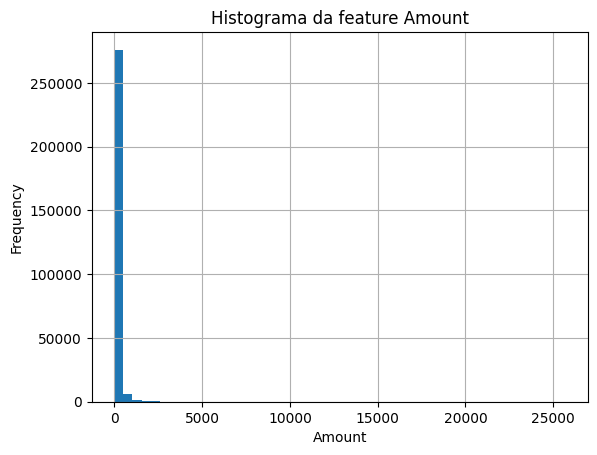

In [ ]:
new_df_cred['Amount'].hist(bins=50)
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.title('Histograma da feature Amount')
plt.show()

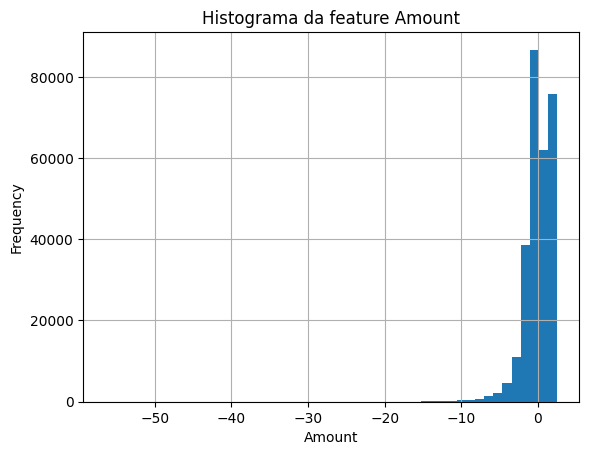

In [ ]:
new_df_cred['V1'].hist(bins=50)
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.title('Histograma da feature Amount')
plt.show()

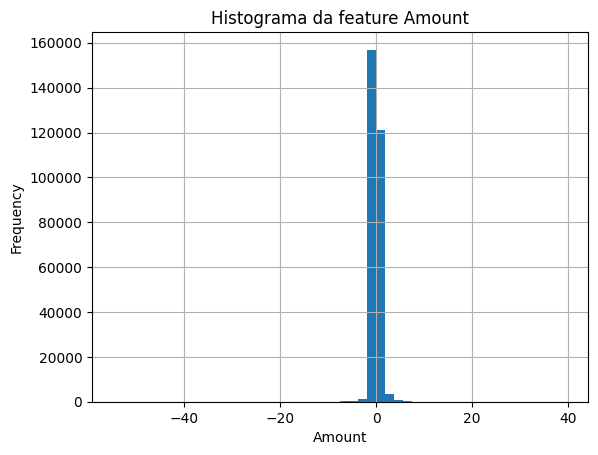

In [ ]:
new_df_cred['V20'].hist(bins=50)
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.title('Histograma da feature Amount')
plt.show()

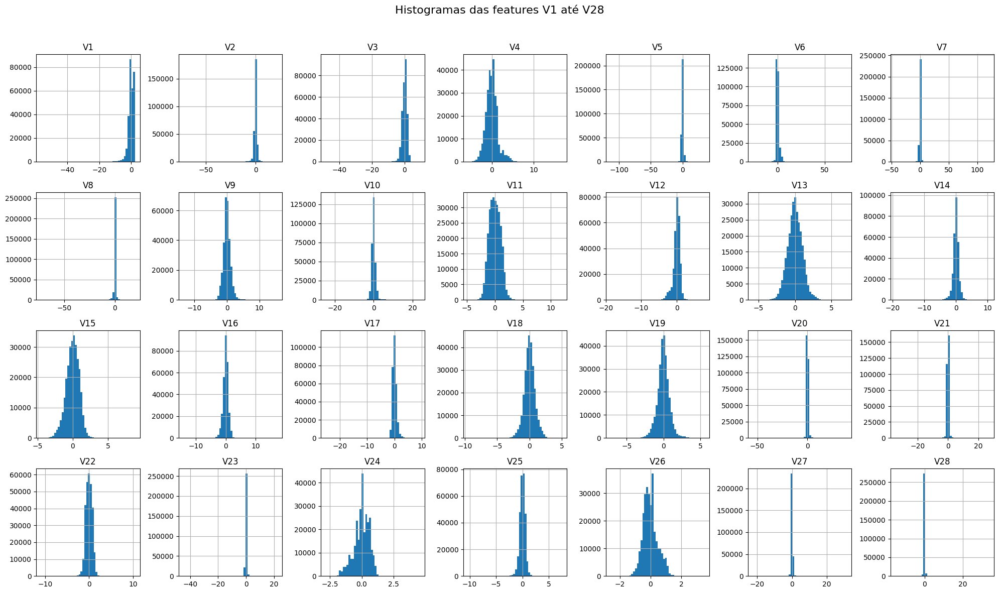

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=7, figsize=(20, 12))
fig.suptitle("Histogramas das features V1 até V28", fontsize=16)

for i, col in enumerate([f'V{i}' for i in range(1, 29)]):
    ax = axes[i // 7, i % 7]
    new_df_cred[col].hist(ax=ax, bins=50)
    ax.set_title(col)
    ax.set_xlabel("")
    ax.set_ylabel("")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

segundo o site atoti.io, A normalização é boa para usar quando a distribuição de dados não segue uma distribuição gaussiana. Note que os dados acima não seguem uma distribuição gaussiana

Vamos normalizar as featuers amount, v1,v5,v6,v7,v8,v20,v21,v23,v27,v28

In [ ]:
df_minimax = new_df_cred.copy()
scaler = MinMaxScaler()
df_minimax['Amount'] = scaler.fit_transform(new_df_cred[['Amount']])
df_minimax['V1'] = scaler.fit_transform(new_df_cred[['V1']])
df_minimax['V5'] = scaler.fit_transform(new_df_cred[['V5']])
df_minimax['V6'] = scaler.fit_transform(new_df_cred[['V6']])
df_minimax['V7'] = scaler.fit_transform(new_df_cred[['V7']])
df_minimax['V8'] = scaler.fit_transform(new_df_cred[['V8']])
df_minimax['V20'] = scaler.fit_transform(new_df_cred[['V21']])
df_minimax['V23'] = scaler.fit_transform(new_df_cred[['V23']])
df_minimax['V27'] = scaler.fit_transform(new_df_cred[['V27']])
df_minimax['V28'] = scaler.fit_transform(new_df_cred[['V28']])
df_minimax['V21'] = scaler.fit_transform(new_df_cred[['V21']])


In [ ]:
df_minimax

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,0.935192,-0.072781,2.536347,1.378155,0.763439,0.267669,0.266815,0.786444,0.363787,...,0.561184,0.277838,0.663793,0.066928,0.128539,-0.189115,0.418976,0.312697,0.005824,0
1,0.0,0.978542,0.266151,0.166480,0.448154,0.766120,0.262192,0.264875,0.786298,-0.255425,...,0.557840,-0.638672,0.666938,-0.339846,0.167170,0.125895,0.416345,0.313423,0.000105,0
2,1.0,0.935217,-1.340163,1.773209,0.379780,0.762329,0.281122,0.270177,0.788042,-1.514654,...,0.565477,0.771679,0.678939,-0.689281,-0.327642,-0.139097,0.415489,0.311911,0.014739,0
3,1.0,0.941878,-0.185226,1.792993,-0.863291,0.765647,0.275559,0.266803,0.789434,-1.387024,...,0.559734,0.005274,0.662607,-1.175575,0.647376,-0.221929,0.417669,0.314371,0.004807,0
4,2.0,0.938617,0.877737,1.548718,0.403034,0.762975,0.263984,0.268968,0.782484,0.817739,...,0.561327,0.798278,0.663392,0.141267,-0.206010,0.502292,0.420561,0.317490,0.002724,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,0.756448,10.071785,-9.834783,-2.066656,0.729603,0.236810,0.235393,0.863749,1.914428,...,0.564920,0.111864,0.680500,-0.509348,1.436807,0.250034,0.433929,0.329840,0.000030,0
284803,172787.0,0.945845,-0.055080,2.035030,-0.738589,0.771561,0.273661,0.265504,0.788548,0.584800,...,0.564933,0.924384,0.665619,-1.016226,-0.606624,-0.395255,0.417775,0.312038,0.000965,0
284804,172788.0,0.990905,-0.301254,-3.249640,-0.557828,0.783425,0.293496,0.263547,0.792985,0.432454,...,0.565220,0.578229,0.664877,0.640134,0.265745,-0.087371,0.416593,0.312585,0.002642,0
284805,172788.0,0.954209,0.530483,0.702510,0.689799,0.763172,0.269291,0.261175,0.792671,0.392087,...,0.565755,0.800049,0.663008,0.123205,-0.569159,0.546668,0.418520,0.315245,0.000389,0


Histograma de amount após MiniMax

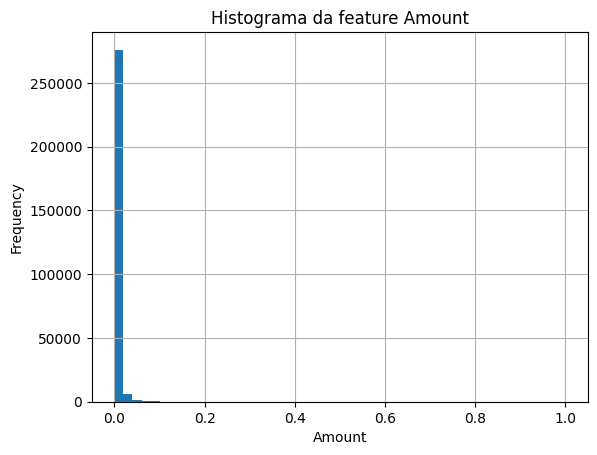

In [ ]:
df_minimax['Amount'].hist(bins=50)
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.title('Histograma da feature Amount')
plt.show()

**Histogramas e scatterplots (não recomendo executar o código abaixo, demora cerca de 1h e 6m)**

In [ ]:
sns.pairplot(new_df_cred, palette="tab10", diag_kind="hist", corner=True, hue='Class')
plt.suptitle("Análise Multivariada com Pairplot", y=1.02)
plt.show()


In [ ]:
X = new_df_cred.drop('Class', axis=1)
Y = new_df_cred['Class']


In [ ]:
X = X.values

In [ ]:
Y.value_counts()

,count
Class,
0,284315
1,492


In [ ]:
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

In [ ]:
param_grid = {'n_neighbors': [3,5,7,9,11,15], 'metric': ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan', 'nan_euclidean']}

In [ ]:
test_scores = []

In [ ]:
for i,(train_index, test_index) in enumerate(kfold.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]

    #divisão dos dados usando NearMiss3
    nm = NearMiss(version=3)
    X_train_resampled, y_train_resampled = nm.fit_resample(X_train, Y_train)


    #utilização do hodoult para gerar o conjunto de validação
    X_trainDivided, X_val, Y_trainDivided, Y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)
    print('divisão das classes de treino pós hodoult', Y_trainDivided.value_counts())
    #acurácia do conjunto de validação
    accs_val = []
    #armazenar os hiperparametros
    par = []
    print(f" Fold { i + 1}: " )
    for params in ParameterGrid(param_grid):
        knn = KNeighborsClassifier(n_neighbors=params['n_neighbors'], metric=params['metric'])
        knn.fit(X_trainDivided, Y_trainDivided)
        y_pred = knn.predict(X_val)
        acc = accuracy_score(Y_val, y_pred)
        accs_val.append(acc)
        par.append(params)

    print(par[accs_val.index(max(accs_val))])

    #Agora vamos iniciar nosso treinamento com os melhores hiperparâmetros encontrados na etapa anterior

    knn_best =  KNeighborsClassifier(metric=par[accs_val.index(max(accs_val))]['metric'], n_neighbors=par[accs_val.index(max(accs_val))]['n_neighbors'])

    #Em seguida, iremos treinar o modelo com o conjunto de treinamento COMPLETO.
    #Acredito que seja com os dados divididos utilizando o NearMiss3
    knn_best.fit(X_train_resampled, y_train_resampled)
    y_pred_best = knn_best.predict(X_test)
    acc = accuracy_score(Y_test, y_pred_best)
    print('acurácia', acc)
    test_scores.append(acc)


print(f"Acurácia média nos conjuntos de teste: {sum(test_scores)/len(test_scores):.4f}")

divisão das classes de treino pós hodoult Class
1    361
0    352
Name: count, dtype: int64
 Fold 1: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9595519820231031
divisão das classes de treino pós hodoult Class
0    354
1    350
Name: count, dtype: int64
 Fold 2: 
{'metric': 'cosine', 'n_neighbors': 5}
acurácia 0.9688915417295741
divisão das classes de treino pós hodoult Class
1    370
0    356
Name: count, dtype: int64
 Fold 3: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9637302061023139
divisão das classes de treino pós hodoult Class
0    350
1    349
Name: count, dtype: int64
 Fold 4: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9414346406376181
divisão das classes de treino pós hodoult Class
0    350
1    349
Name: count, dtype: int64
 Fold 5: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9603595379375724
divisão das classes de treino pós hodoult Class
1    365
0    358
Name: count, dtype: int64
 Fold 6: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.943

In [ ]:
y_train_resampled.value_counts()

,count
Class,
0,439
1,439


In [ ]:
X_train_resampled

array([[ 4.43100000e+03, -1.07081992e+00,  4.57695073e-01, ...,
        -9.47506488e-02,  2.99364847e-02,  2.26000000e+02],
       [ 4.49200000e+03,  8.13420668e-01, -7.48425755e-01, ...,
        -9.02439719e-02,  5.05997161e-02,  2.00000000e+02],
       [ 4.52100000e+03,  1.10734468e+00, -1.14329520e+00, ...,
        -4.79151563e-02,  3.14950072e-02,  1.83930000e+02],
       ...,
       [ 1.69351000e+05, -6.76142671e-01,  1.12636606e+00, ...,
         3.85107449e-01,  1.94361479e-01,  7.78900000e+01],
       [ 1.69966000e+05, -3.11383161e+00,  5.85864172e-01, ...,
         8.84875540e-01, -2.53700319e-01,  2.45000000e+02],
       [ 1.70348000e+05,  1.99197610e+00,  1.58475887e-01, ...,
         2.98758224e-03, -1.53088128e-02,  4.25300000e+01]])

Utilizando o árvore de decisão

In [ ]:
param_grid_tree = { 'max_depth': [10 , 20 , 30 , 40 , 50 , 60 , 70 , 80 , 90 ,100]}

In [ ]:
test_scores_tree = []

In [ ]:
for i,(train_index, test_index) in enumerate(kfold.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    #divisão dos dados usando NearMiss3
    nm = NearMiss(version=3)
    X_train_resampled, y_train_resampled = nm.fit_resample(X_train, Y_train)


    print('divisão das classes', y_train_resampled.value_counts())

    #utilização do hodoult para gerar o conjunto de validação
    X_trainDivided, X_val, Y_trainDivided, Y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)

    #acurácia do conjunto de validação
    accs_val = []
    #armazenar os hiperparametros
    par = []
    print(f" Fold { i + 1}: " )
    for params in ParameterGrid(param_grid_tree):
        tree = DecisionTreeClassifier(max_depth=params['max_depth'])
        tree.fit(X_trainDivided, Y_trainDivided)
        y_pred = tree.predict(X_val)
        acc = accuracy_score(Y_val, y_pred)
        accs_val.append(acc)
        par.append(params)

    print(par[accs_val.index(max(accs_val))])

    #Agora vamos iniciar nosso treinamento com os melhores hiperparâmetros encontrados na etapa anterior

    tree_best = DecisionTreeClassifier(max_depth=par[accs_val.index(max(accs_val))]['max_depth'])

    #Em seguida, iremos treinar o modelo com o conjunto de treinamento COMPLETO.
    #Acredito que seja com os dados divididos utilizando o NearMiss3
    tree_best.fit(X_train_resampled, y_train_resampled)
    y_pred_best = tree_best.predict(X_test)
    acc = accuracy_score(Y_test, y_pred_best)
    print('acurácia', acc)
    test_scores_tree.append(acc)


print(f"Acurácia média nos conjuntos de teste: {sum(test_scores_tree)/len(test_scores_tree):.4f}")

divisão das classes Class
0    446
1    446
Name: count, dtype: int64
 Fold 1: 
{'max_depth': 10}
acurácia 0.910887960394649
divisão das classes Class
0    440
1    440
Name: count, dtype: int64
 Fold 2: 
{'max_depth': 60}
acurácia 0.8782346125487167
divisão das classes Class
0    454
1    454
Name: count, dtype: int64
 Fold 3: 
{'max_depth': 10}
acurácia 0.8810435026860012
divisão das classes Class
0    437
1    437
Name: count, dtype: int64
 Fold 4: 
{'max_depth': 50}
acurácia 0.8993715108317826
divisão das classes Class
0    437
1    437
Name: count, dtype: int64
 Fold 5: 
{'max_depth': 10}
acurácia 0.9204030757347004
divisão das classes Class
0    452
1    452
Name: count, dtype: int64
 Fold 6: 
{'max_depth': 50}
acurácia 0.9038306239247218
divisão das classes Class
0    444
1    444
Name: count, dtype: int64
 Fold 7: 
{'max_depth': 10}
acurácia 0.8993012885783505
divisão das classes Class
0    439
1    439
Name: count, dtype: int64
 Fold 8: 
{'max_depth': 30}
acurácia 0.8812851123

agr utilizando o NearMiss3 antes da divisão dos folds

In [ ]:
#divisão das classes
Y.value_counts()

,count
Class,
0,284315
1,492


inicializando o kfold

In [ ]:
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

In [ ]:
param_grid = {'n_neighbors': [3,5,7,9,11,15], 'metric': ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan', 'nan_euclidean']}

In [ ]:
test_scores = []

In [ ]:
nm = NearMiss(version=3)
X_train_resampled, y_train_resampled = nm.fit_resample(X, Y)

In [ ]:
#divisão das classes depois do NearMiss3
y_train_resampled.value_counts()

,count
Class,
0,492
1,492


Utilizo o X já dividido com NearMiss3

In [ ]:
for i,(train_index, test_index) in enumerate(kfold.split(X_train_resampled)):
    X_train, X_test = X_train_resampled[train_index], X_train_resampled[test_index]
    Y_train, Y_test = y_train_resampled[train_index], y_train_resampled[test_index]

    #utilização do hodoult para gerar o conjunto de validação
    X_trainDivided, X_val, Y_trainDivided, Y_val = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)
    print('divisão das classes de treino pós hodoult', Y_trainDivided.value_counts())
    #acurácia do conjunto de validação
    accs_val = []
    #armazenar os hiperparametros
    par = []
    print(f" Fold { i + 1}: " )
    for params in ParameterGrid(param_grid):
        knn = KNeighborsClassifier(n_neighbors=params['n_neighbors'], metric=params['metric'])
        knn.fit(X_trainDivided, Y_trainDivided)
        y_pred = knn.predict(X_val)
        acc = accuracy_score(Y_val, y_pred)
        accs_val.append(acc)
        par.append(params)

    print(par[accs_val.index(max(accs_val))])

    #Agora vamos iniciar nosso treinamento com os melhores hiperparâmetros encontrados na etapa anterior

    knn_best =  KNeighborsClassifier(metric=par[accs_val.index(max(accs_val))]['metric'], n_neighbors=par[accs_val.index(max(accs_val))]['n_neighbors'])

    #Em seguida, iremos treinar o modelo com o conjunto de treinamento COMPLETO.
    #Acredito que seja com os dados divididos utilizando o NearMiss3
    knn_best.fit(X_train, Y_train)
    y_pred_best = knn_best.predict(X_test)
    acc = accuracy_score(Y_test, y_pred_best)
    print('acurácia', acc)
    test_scores.append(acc)


print(f"Acurácia média nos conjuntos de teste: {sum(test_scores)/len(test_scores):.4f}")

divisão das classes de treino pós hodoult Class
1    360
0    348
Name: count, dtype: int64
 Fold 1: 
{'metric': 'cosine', 'n_neighbors': 15}
acurácia 0.7575757575757576
divisão das classes de treino pós hodoult Class
1    357
0    351
Name: count, dtype: int64
 Fold 2: 
{'metric': 'cosine', 'n_neighbors': 5}
acurácia 0.8383838383838383
divisão das classes de treino pós hodoult Class
1    361
0    347
Name: count, dtype: int64
 Fold 3: 
{'metric': 'cosine', 'n_neighbors': 5}
acurácia 0.898989898989899
divisão das classes de treino pós hodoult Class
1    361
0    347
Name: count, dtype: int64
 Fold 4: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.898989898989899
divisão das classes de treino pós hodoult Class
1    361
0    347
Name: count, dtype: int64
 Fold 5: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.8877551020408163
divisão das classes de treino pós hodoult Class
1    364
0    344
Name: count, dtype: int64
 Fold 6: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.8673

# **Treinando usando o dataset que algumas features estão normalizadas**

In [ ]:
X = df_minimax.drop('Class', axis=1)
Y = df_minimax['Class']

In [ ]:
X = X.values

In [ ]:
Y.value_counts()

,count
Class,
0,284315
1,492


In [ ]:
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

In [ ]:
param_grid = {'n_neighbors': [3,5,7,9,11,15], 'metric': ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan', 'nan_euclidean']}

In [ ]:
test_scores = []

In [ ]:
for i,(train_index, test_index) in enumerate(kfold.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]

    #divisão dos dados usando NearMiss3
    nm = NearMiss(version=3)
    X_train_resampled, y_train_resampled = nm.fit_resample(X_train, Y_train)


    #utilização do hodoult para gerar o conjunto de validação
    X_trainDivided, X_val, Y_trainDivided, Y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)
    print('divisão das classes de treino pós hodoult', Y_trainDivided.value_counts())
    #acurácia do conjunto de validação
    accs_val = []
    #armazenar os hiperparametros
    par = []
    print(f" Fold { i + 1}: " )
    for params in ParameterGrid(param_grid):
        knn = KNeighborsClassifier(n_neighbors=params['n_neighbors'], metric=params['metric'])
        knn.fit(X_trainDivided, Y_trainDivided)
        y_pred = knn.predict(X_val)
        acc = accuracy_score(Y_val, y_pred)
        accs_val.append(acc)
        par.append(params)

    print(par[accs_val.index(max(accs_val))])

    #Agora vamos iniciar nosso treinamento com os melhores hiperparâmetros encontrados na etapa anterior

    knn_best =  KNeighborsClassifier(metric=par[accs_val.index(max(accs_val))]['metric'], n_neighbors=par[accs_val.index(max(accs_val))]['n_neighbors'])

    #Em seguida, iremos treinar o modelo com o conjunto de treinamento COMPLETO.
    #Acredito que seja com os dados divididos utilizando o NearMiss3
    knn_best.fit(X_train_resampled, y_train_resampled)
    y_pred_best = knn_best.predict(X_test)
    acc = accuracy_score(Y_test, y_pred_best)
    print('acurácia', acc)
    test_scores.append(acc)


print(f"Acurácia média nos conjuntos de teste: {sum(test_scores)/len(test_scores):.4f}")

divisão das classes de treino pós hodoult Class
1    361
0    352
Name: count, dtype: int64
 Fold 1: 
{'metric': 'cosine', 'n_neighbors': 9}
acurácia 0.9864471050876022
divisão das classes de treino pós hodoult Class
0    354
1    350
Name: count, dtype: int64
 Fold 2: 
{'metric': 'cosine', 'n_neighbors': 11}
acurácia 0.9829711035427127
divisão das classes de treino pós hodoult Class
1    370
0    356
Name: count, dtype: int64
 Fold 3: 
{'metric': 'cosine', 'n_neighbors': 5}
acurácia 0.9702959867982164
divisão das classes de treino pós hodoult Class
0    350
1    349
Name: count, dtype: int64
 Fold 4: 
{'metric': 'cosine', 'n_neighbors': 5}
acurácia 0.9783013236894772
divisão das classes de treino pós hodoult Class
0    350
1    349
Name: count, dtype: int64
 Fold 5: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9535830904813736
divisão das classes de treino pós hodoult Class
1    365
0    358
Name: count, dtype: int64
 Fold 6: 
{'metric': 'cosine', 'n_neighbors': 11}
acurácia 0.9

# agora normalizando todas as features de v1 até v28 e também amount

In [ ]:
df_minimax_all = new_df_cred.copy()
scaler = MinMaxScaler()
df_minimax_all['Amount'] = scaler.fit_transform(new_df_cred[['Amount']])

In [ ]:
df_minimax_all

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.005824,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0.000105,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0.014739,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.004807,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0.002724,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.000030,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,0.000965,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,0.002642,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,0.000389,0


In [ ]:
features = [f'V{i}' for i in range(1, 29)]
df_minimax_all[features] = scaler.fit_transform(new_df_cred[features])

In [ ]:
df_minimax_all.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0
1,0.0,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,...,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423,0.000105,0
2,1.0,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,...,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911,0.014739,0
3,1.0,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,...,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371,0.004807,0
4,2.0,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,...,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490,0.002724,0


# Agora com muitas mais features normalizadas, vamos testar o modelo novamente

In [ ]:
X = df_minimax_all.drop('Class', axis=1)
Y = df_minimax_all['Class']

In [ ]:
X = X.values

In [ ]:
Y.value_counts()

,count
Class,
0,284315
1,492


In [ ]:
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

In [ ]:
param_grid = {'n_neighbors': [3,5,7,9,11,15], 'metric': ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan', 'nan_euclidean']}

In [ ]:
test_scores = []

In [ ]:
for i,(train_index, test_index) in enumerate(kfold.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]

    #divisão dos dados usando NearMiss3
    nm = NearMiss(version=3)
    X_train_resampled, y_train_resampled = nm.fit_resample(X_train, Y_train)


    #utilização do hodoult para gerar o conjunto de validação
    X_trainDivided, X_val, Y_trainDivided, Y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)
    print('divisão das classes de treino pós hodoult', Y_trainDivided.value_counts())
    #acurácia do conjunto de validação
    accs_val = []
    #armazenar os hiperparametros
    par = []
    print(f" Fold { i + 1}: " )
    for params in ParameterGrid(param_grid):
        knn = KNeighborsClassifier(n_neighbors=params['n_neighbors'], metric=params['metric'])
        knn.fit(X_trainDivided, Y_trainDivided)
        y_pred = knn.predict(X_val)
        acc = accuracy_score(Y_val, y_pred)
        accs_val.append(acc)
        par.append(params)

    print(par[accs_val.index(max(accs_val))])

    #Agora vamos iniciar nosso treinamento com os melhores hiperparâmetros encontrados na etapa anterior

    knn_best =  KNeighborsClassifier(metric=par[accs_val.index(max(accs_val))]['metric'], n_neighbors=par[accs_val.index(max(accs_val))]['n_neighbors'])

    #Em seguida, iremos treinar o modelo com o conjunto de treinamento COMPLETO.
    #Acredito que seja com os dados divididos utilizando o NearMiss3
    knn_best.fit(X_train_resampled, y_train_resampled)
    y_pred_best = knn_best.predict(X_test)
    acc = accuracy_score(Y_test, y_pred_best)
    print('acurácia', acc)
    test_scores.append(acc)


print(f"Acurácia média nos conjuntos de teste: {sum(test_scores)/len(test_scores):.4f}")

divisão das classes de treino pós hodoult Class
1    361
0    352
Name: count, dtype: int64
 Fold 1: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9650293177908079
divisão das classes de treino pós hodoult Class
0    354
1    350
Name: count, dtype: int64
 Fold 2: 
{'metric': 'cosine', 'n_neighbors': 5}
acurácia 0.9874302166356519
divisão das classes de treino pós hodoult Class
1    370
0    356
Name: count, dtype: int64
 Fold 3: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9695937642638952
divisão das classes de treino pós hodoult Class
0    350
1    349
Name: count, dtype: int64
 Fold 4: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9702959867982164
divisão das classes de treino pós hodoult Class
0    350
1    349
Name: count, dtype: int64
 Fold 5: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.970752431445525
divisão das classes de treino pós hodoult Class
1    365
0    358
Name: count, dtype: int64
 Fold 6: 
{'metric': 'cosine', 'n_neighbors': 3}
acurácia 0.9708